## Uniform weights

$$K = \frac{1}{9} \begin{bmatrix} 1 & 1 & 1 \\ 1 & 1 & 1 \\ 1 & 1 & 1 \end{bmatrix}$$

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


image = cv2.imread('/content/drive/MyDrive/Recent Codes/J13Wn.jpg')

# Creating our 3 x 3 kernel
kernel_3x3 = np.ones((3, 3), np.float32) / 9

# We use the cv2.fitler2D to conovlve the kernal with an image
blurred = cv2.filter2D(image, -1, kernel_3x3)


# Creating our 7 x 7 kernel
kernel_7x7 = np.ones((7, 7), np.float32) / 49

blurred2 = cv2.filter2D(image, -1, kernel_7x7)

plt.figure(figsize=[15,5])
plt.subplot(131);plt.imshow(image[...,::-1]);plt.title("Original")
plt.subplot(132);plt.imshow(blurred[...,::-1]);plt.title("blurred with 3x3 filter")
plt.subplot(133);plt.imshow(blurred2[...,::-1]);plt.title("blurred with 7x7 filter")

[ WARN:0@2538.702] global loadsave.cpp:278 findDecoder imread_('/content/drive/MyDrive/Recent Codes/J13Wn.jpg'): can't open/read file: check file path/integrity


error: OpenCV(4.13.0) /Users/xperience/GHA-OpenCV-Python/_work/opencv-python/opencv-python/opencv/modules/imgproc/src/filter.dispatch.cpp:1594: error: (-215:Assertion failed) !_src.empty() in function 'filter2D'


## Non-uniform weights

If only σx (sigmaX) is specified, then σy (sigmaY) is automatically set equal to σx.

If both σx and σy are set to 0, their values are automatically calculated based on the kernel size.

Gaussian blurring is highly effective for removing Gaussian noise from an image because it performs weighted averaging, giving more importance to pixels near the center of the kernel.

## Non-Uniform (Gaussian) Filter Equation

A Gaussian filter is a **non-uniform filter**, meaning its weights are not equal.  
The weights follow a Gaussian (normal) distribution.

---

### 2D Gaussian Filter Equation

$$
G(x, y) = \frac{1}{2\pi \sigma_x \sigma_y}
\exp \left(
-\left(
\frac{x^2}{2\sigma_x^2} + \frac{y^2}{2\sigma_y^2}
\right)
\right)
$$

---

### Where:

- \( x, y \) → spatial coordinates relative to the kernel center  
- \( \sigma_x \) → standard deviation in the x-direction  
- \( \sigma_y \) → standard deviation in the y-direction  
- \( \exp \) → exponential function  

---

### Special Case (Isotropic Gaussian Filter)

If:

$$
\sigma_x = \sigma_y = \sigma
$$

Then the equation simplifies to:

$$
G(x, y) = \frac{1}{2\pi \sigma^2}
\exp \left(
-\frac{x^2 + y^2}{2\sigma^2}
\right)
$$

---

### Uniform (Mean) Filter for Comparison

A uniform filter assigns equal weights to all kernel elements:

$$
H(x, y) = \frac{1}{M \times N}
$$

---

### Key Difference

- **Uniform filter** → All weights are equal  
- **Gaussian filter** → Center pixels have higher weights, distant pixels have lower weights  
- Gaussian filtering is more effective for removing Gaussian noise while preserving image structures.

Text(0.5, 1.0, 'After bilateral filter')

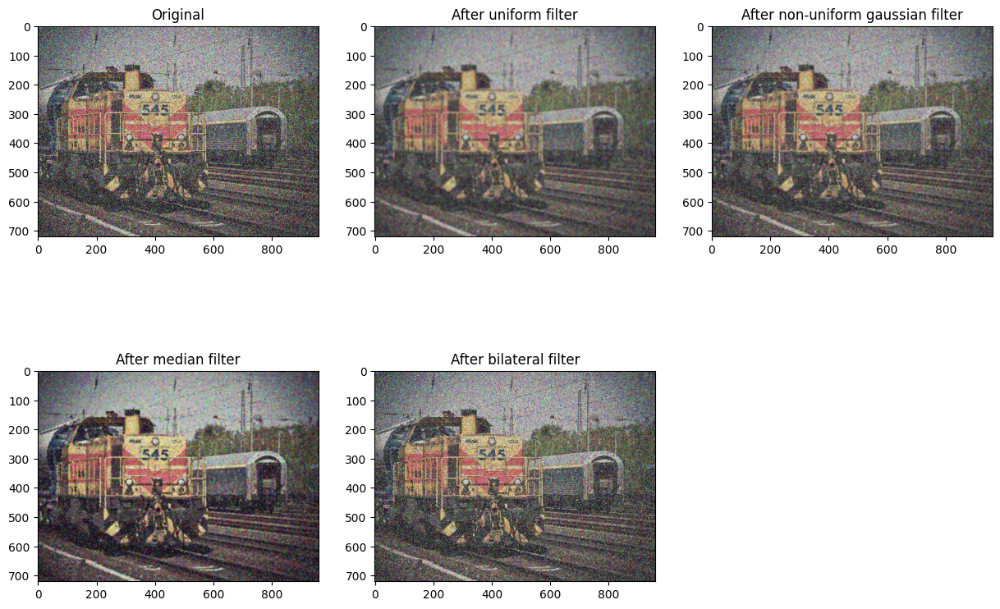

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread('/content/drive/MyDrive/Recent Codes/J13Wn.jpg')

# Averaging done by convolving the image with a normalized box filter.
# This takes the pixels under the box and replaces the central element
# Box size needs to odd and positive
blur = cv2.blur(image, (7,7))

# Instead of box filter, gaussian kernel
gaussian = cv2.GaussianBlur(image, (7,7), 0)

# Takes median of all the pixels under kernel area and central
# element is replaced with this median value
median = cv2.medianBlur(image, 5)

# Bilateral is very effective in noise removal while keeping edges sharp
bilateral = cv2.bilateralFilter(image, 9, 75, 75)


plt.figure(figsize=[15,10])
plt.subplot(231);plt.imshow(image[...,::-1]);plt.title("Original")
plt.subplot(232);plt.imshow(blur[...,::-1]);plt.title("After uniform filter")
plt.subplot(233);plt.imshow(gaussian[...,::-1]);plt.title("After non-uniform gaussian filter")
plt.subplot(234);plt.imshow(median[...,::-1]);plt.title("After median filter")
plt.subplot(235);plt.imshow(bilateral[...,::-1]);plt.title("After bilateral filter")

Text(0.5, 1.0, 'Gaussian filter, sigma=5')

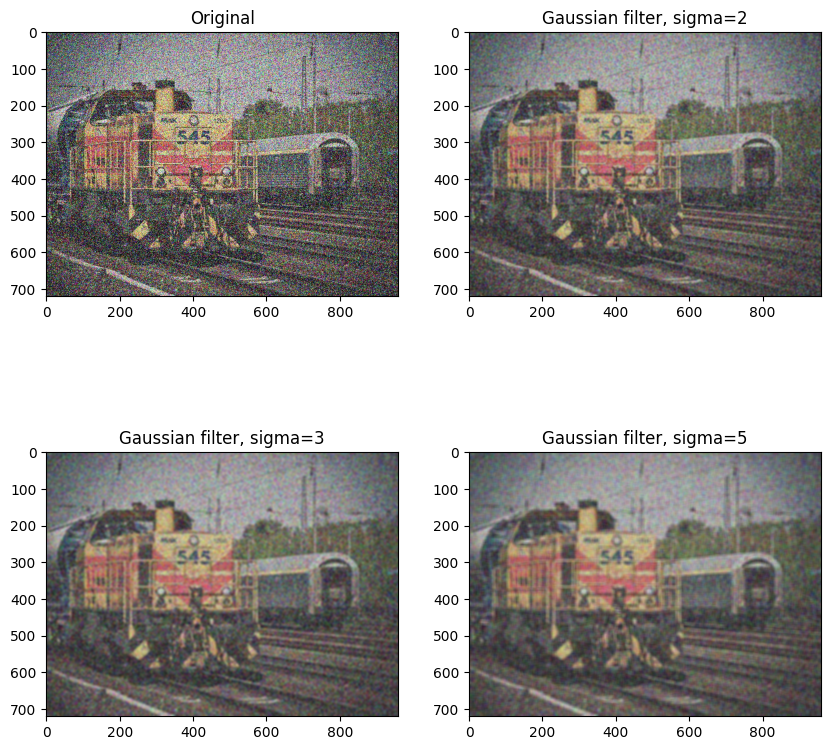

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread('/content/drive/MyDrive/Recent Codes/J13Wn.jpg')

gaussian2 = cv2.GaussianBlur(image, (11,11), 2)
gaussian3 = cv2.GaussianBlur(image, (11,11), 3)
gaussian5 = cv2.GaussianBlur(image, (11,11), 5)

plt.figure(figsize=[10,10])
plt.subplot(221);plt.imshow(image[...,::-1]);plt.title("Original");
plt.subplot(222);plt.imshow(gaussian2[...,::-1]);plt.title("Gaussian filter, sigma=2")
plt.subplot(223);plt.imshow(gaussian3[...,::-1]);plt.title("Gaussian filter, sigma=3")
plt.subplot(224);plt.imshow(gaussian5[...,::-1]);plt.title("Gaussian filter, sigma=5")

## Image De-noising – Non-Local Means Denoising (NLM)

Non-Local Means (NLM) is an advanced image de-noising algorithm that removes noise
while preserving edges and fine details.

Unlike local filters (e.g., Gaussian filter) that average neighboring pixels,
NLM computes the denoised value of a pixel by taking a weighted average of
all pixels in the image based on similarity.

---

### Core Idea

Instead of averaging only nearby pixels, NLM:

- Compares small patches around pixels
- Finds similar patches across the entire image
- Assigns higher weights to more similar patches
- Computes a weighted average

---

### Mathematical Formulation

For a noisy image \( I \), the denoised pixel value at location \( i \) is:

$$
NL[I](i) = \sum_{j \in \Omega} w(i,j) \, I(j)
$$

Where:

- \( \Omega \) → search window (possibly entire image)
- \( w(i,j) \) → similarity-based weight
- \( I(j) \) → intensity at pixel \( j \)

---

### Weight Function

$$
w(i,j) = \frac{1}{Z(i)}
\exp \left(
-\frac{ \| P_i - P_j \|^2 }{h^2}
\right)
$$

Where:

- \( P_i \), \( P_j \) → patches centered at pixels \( i \) and \( j \)
- \( \| P_i - P_j \|^2 \) → squared Euclidean distance between patches
- \( h \) → filtering parameter (controls smoothing strength)
- \( Z(i) \) → normalization factor

$$
Z(i) = \sum_{j \in \Omega}
\exp \left(
-\frac{ \| P_i - P_j \|^2 }{h^2}
\right)
$$

---

### Key Parameters

| Parameter | Effect |
|-----------|--------|
| `h` | Larger → stronger smoothing |
| Patch size | Larger → more structural comparison |
| Search window size | Larger → better denoising but slower computation |

---

### Advantages

- Excellent edge preservation  
- Effective for Gaussian noise  
- Maintains fine textures  

---

### Disadvantages

- Computationally expensive  
- Slower than local filters  
- Requires careful parameter tuning  

Text(0.5, 1.0, 'result')

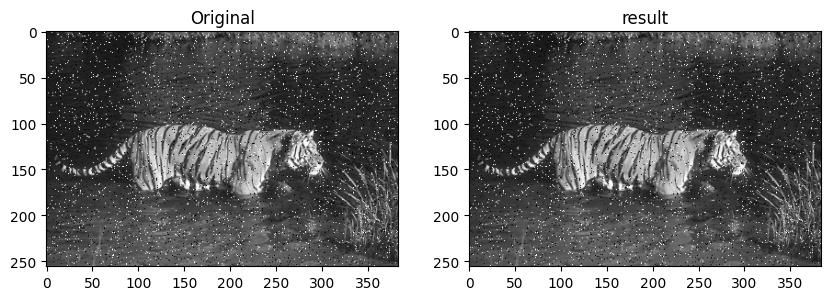

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread('/content/drive/MyDrive/Recent Codes/noisy.png')

# Parameters, after None are - the filter strength 'h' (5-10 is a good range)
# Next is hForColorComponents, set as same value as h again
#
dst = cv2.fastNlMeansDenoisingColored(image, None, 6, 6, 7, 21)

plt.figure(figsize=[10,10])
plt.subplot(221);plt.imshow(image[...,::-1]);plt.title("Original")
plt.subplot(222);plt.imshow(dst[...,::-1]);plt.title("result")

**There are 4 variations of Non-Local Means Denoising:**

- cv2.fastNlMeansDenoising() - works with a single grayscale images
- cv2.fastNlMeansDenoisingColored() - works with a color image.
- cv2.fastNlMeansDenoisingMulti() - works with image sequence captured in short period of time (grayscale images)
- cv2.fastNlMeansDenoisingColoredMulti() - same as above, but for color images.

https://docs.opencv.org/3.3.1/d5/d69/tutorial_py_non_local_means.html

## Image Sharpening

Image sharpening enhances edges and fine details by emphasizing high-frequency components in an image.

Sharpening increases contrast at intensity transitions, making the image appear clearer and more defined.

---

## 1️⃣ Unsharp Masking (Most Common Method)

Sharpening is often performed using **Unsharp Masking**:

### Step 1: Blur the image
$$
I_{blur} = I * G
$$

### Step 2: Extract details (high-frequency components)
$$
Mask = I - I_{blur}
$$

### Step 3: Add scaled details back to the image
$$
I_{sharp} = I + k \cdot (I - I_{blur})
$$

Where:

- \( I \) → original image  
- \( G \) → Gaussian kernel  
- \( k \) → sharpening factor  
- \( * \) → convolution  

---

### Effect of Parameter \( k \)

| k Value | Effect |
|----------|--------|
| \( k = 0 \) | No sharpening |
| \( 0 < k < 1 \) | Mild sharpening |
| \( k = 1 \) | Standard sharpening |
| \( k > 1 \) | Strong sharpening |
| Large k | Over-sharpening & noise amplification |

---

## 2️⃣ Laplacian-Based Sharpening

Another approach uses the Laplacian operator:

$$
I_{sharp} = I - \lambda \nabla^2 I
$$

Where:

- \( \nabla^2 I \) → Laplacian (second derivative)
- \( \lambda \) → sharpening strength

Common Laplacian kernel:

$$
\begin{bmatrix}
0 & -1 & 0 \\
-1 & 4 & -1 \\
0 & -1 & 0
\end{bmatrix}
$$

---

## Why Sharpening Works

- Edges correspond to rapid intensity changes.
- High-pass filtering enhances these rapid changes.
- The result increases local contrast at boundaries.

---

## ⚠️ Important Note

Sharpening also amplifies noise.  
It is often recommended to apply mild smoothing (e.g., Gaussian blur) before sharpening.

[[-0.11111111 -0.11111111 -0.11111111]
 [-0.11111111  1.88888889 -0.11111111]
 [-0.11111111 -0.11111111 -0.11111111]]


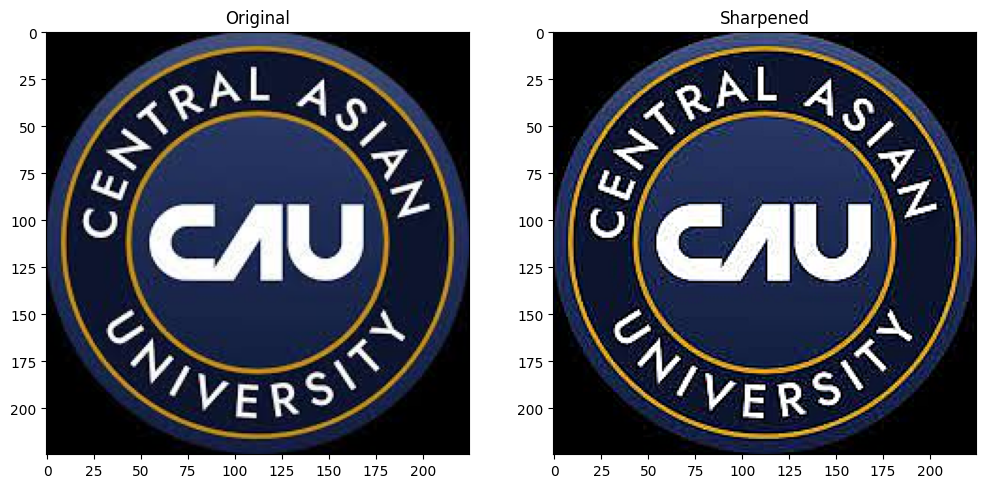

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread('/content/drive/MyDrive/Recent Codes/images.jpg')

kernel1 = np.array([[0,0,0],
                              [0,2,0],
                              [0,0,0]])

kernel2 = 1/9*np.array([[1,1,1],
                              [1,1,1],
                              [1,1,1]])

final_kernel = kernel1-kernel2
# applying different kernels to the input image
sharpened = cv2.filter2D(image, -1, final_kernel)

plt.figure(figsize=[12,7])
plt.subplot(121);plt.imshow(image[...,::-1]);plt.title("Original")
plt.subplot(122);plt.imshow(sharpened[...,::-1]);plt.title("Sharpened")
print(final_kernel)

Text(0.5, 1.0, 'Sharpened')

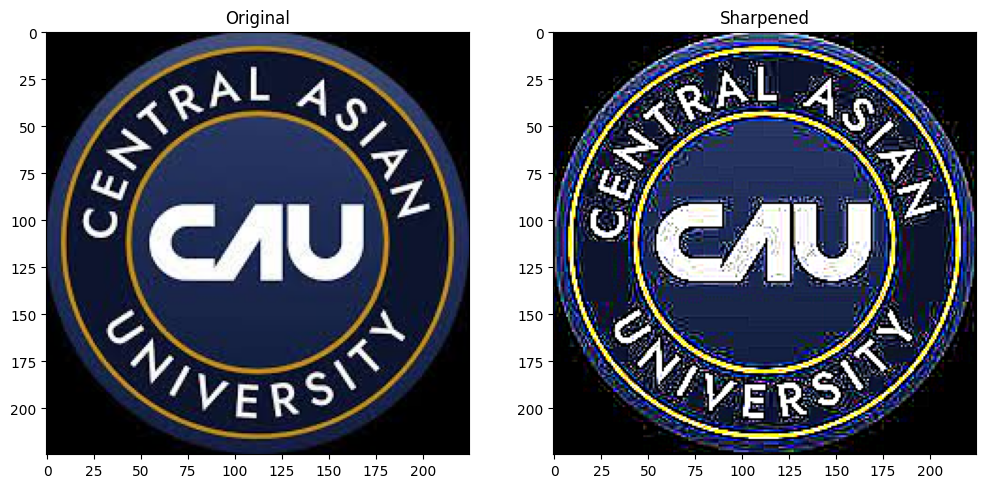

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread('/content/drive/MyDrive/Recent Codes/images.jpg')

kernel_sharpening = np.array([[-1,-1,-1],
                              [-1,9,-1],
                              [-1,-1,-1]])

# applying different kernels to the input image
sharpened = cv2.filter2D(image, -1, kernel_sharpening)

plt.figure(figsize=[12,7])
plt.subplot(121);plt.imshow(image[...,::-1]);plt.title("Original")
plt.subplot(122);plt.imshow(sharpened[...,::-1]);plt.title("Sharpened")

## Edge Detection and Image Gradient

Edge detection is a fundamental technique in image processing that identifies points in an image where intensity changes sharply.  
These points often correspond to object boundaries, textures, or important features.

---

### 1️⃣ Image Gradient

The **gradient** measures the rate of change of intensity at each pixel.  
It is a vector with **magnitude** and **direction**:

$$
\nabla I =
\begin{bmatrix}
G_x \\
G_y
\end{bmatrix}
=
\begin{bmatrix}
\frac{\partial I}{\partial x} \\
\frac{\partial I}{\partial y}
\end{bmatrix}
$$

- \(G_x, G_y\) → gradients along x and y axes  
- **Gradient magnitude**:  
$$
|\nabla I| = \sqrt{G_x^2 + G_y^2}
$$  
- **Gradient direction**:  
$$
\theta = \arctan\left(\frac{G_y}{G_x}\right)
$$

---

### 2️⃣ Common Edge Detection Operators

| Operator | Description |
|----------|------------|
| **Sobel** | Approximates gradient using convolution with Sobel kernels. |
| **Prewitt** | Similar to Sobel but with uniform weights. |
| **Roberts** | Uses 2×2 kernels for diagonal gradients. |
| **Canny** | Multi-step algorithm: smoothing, gradient, non-maximum suppression, hysteresis. |

---

### 3️⃣ Steps in Edge Detection

1. **Smoothing** – Reduce noise using Gaussian blur  
2. **Gradient computation** – Calculate magnitude & direction  
3. **Non-maximum suppression** – Thin edges  
4. **Thresholding / Hysteresis** – Select significant edges

---

### Key Notes

- Edges correspond to **high gradient magnitudes**  
- Gradient-based methods are sensitive to noise → smoothing is important  
- Used in **feature extraction, object detection, and image analysis**

```cv2.filter2D(src, ddepth, kernel)```

The function does actually compute ``correlation``, ``not the convolution``

## Function to Check Matrix Range and Type

The following Python function takes a matrix (2D list or NumPy array) and prints:

- The **minimum and maximum values** (range)  
- The **data type** of the matrix elements  

In [9]:
import numpy as np

def check_matrix_range(matrix):
    """
    Prints the range (min, max) and type of a matrix.

    Parameters:
    matrix : list of lists or numpy array
        Input matrix to be analyzed.
    """
    # Convert list of lists to NumPy array if needed
    mat = np.array(matrix)

    # Get min and max
    min_val = np.min(mat)
    max_val = np.max(mat)

    # Get data type
    dtype = mat.dtype

    print(f"Matrix type: {dtype}")
    print(f"Minimum value: {min_val}")
    print(f"Maximum value: {max_val}")
    print(f"Range: {min_val} to {max_val}")

# Example usage
matrix = [[1, 2, 3],
          [4, 5, 6],
          [7, 8, 9]]

check_matrix_range(matrix)

Matrix type: int64
Minimum value: 1
Maximum value: 9
Range: 1 to 9


## Displaying Image Gradient with Fuzzy Brightness Variations

This technique visualizes the **gradient of an image** while accounting for **fuzzy changes in brightness**, rather than sharp intensity differences.  
It is particularly useful for highlighting edges in images with **gradual transitions** or **soft boundaries**.

---

### 1️⃣ Concept

- The **image gradient** measures the rate of intensity change at each pixel.  
- **Fuzzy brightness variations** map gradient magnitudes to a **soft scale** (0–1), emphasizing subtle intensity changes.  
- This reduces the effect of noise and enhances important structural information.

---

### 2️⃣ Fuzzy Gradient Computation

1. Compute the **gradient** (e.g., using Sobel operator):

$$
G_x = I * S_x, \quad G_y = I * S_y
$$

$$
|\nabla I| = \sqrt{G_x^2 + G_y^2}
$$

Where \(S_x\) and \(S_y\) are Sobel kernels in x and y directions.

2. Apply a **fuzzy membership function** to normalize the gradient:

$$
\mu(x, y) = \frac{|\nabla I(x, y)| - G_{\min}}{G_{\max} - G_{\min}}
$$

- \( \mu(x, y) \in [0, 1] \)  
- \( G_{\min}, G_{\max} \) → minimum and maximum gradient values  
- Highlights **soft edges** and subtle transitions.

---

### 3️⃣ Visualization

- Map fuzzy gradient values to **0–255** for display.  
- Use a colormap (grayscale or color) to show gradient strength.  
- Brighter regions → **stronger edges**  
- Darker regions → **weaker/fuzzy edges**



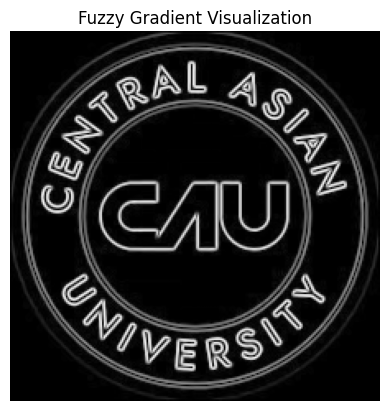

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load grayscale image
img = cv2.imread('/content/drive/MyDrive/Recent Codes/images.jpg', cv2.IMREAD_GRAYSCALE)

# Compute Sobel gradients
Gx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)
Gy = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)
grad_mag = np.sqrt(Gx**2 + Gy**2)

# Apply fuzzy normalization
Gmin, Gmax = grad_mag.min(), grad_mag.max()
fuzzy_grad = (grad_mag - Gmin) / (Gmax - Gmin)

# Display fuzzy gradient
plt.imshow(fuzzy_grad, cmap='gray')
plt.title('Fuzzy Gradient Visualization')
plt.axis('off')
plt.show()

Min: 0, Max: 255, dtype: uint8
Min: 0, Max: 128, dtype: uint8


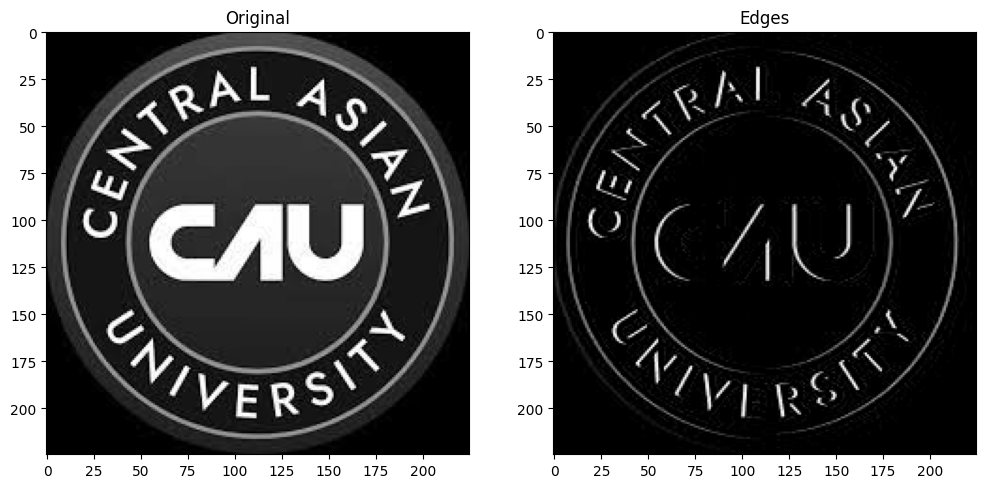

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


image = cv2.imread('/content/drive/MyDrive/Recent Codes/images.jpg',0)

kernel = np.array([[0,0,0],
                   [-1/2,0,1/2],
                   [0,0,0]])


# Extract Sobl Edges
edges = cv2.filter2D(image, -1 , kernel)

plt.figure(figsize=[12,7])
plt.subplot(121);plt.imshow(image, cmap='gray');plt.title("Original");
plt.subplot(122);plt.imshow(edges, cmap='gray');plt.title("Edges");

print_min_and_max(image)
print_min_and_max(edges)

## Displaying Image Gradient with Sudden Brightness Changes

This technique visualizes the **gradient of an image** focusing on **abrupt or sudden intensity changes**.  
It is ideal for detecting **sharp edges**, object boundaries, or high-contrast regions.

---

### 1️⃣ Concept

- **Gradient** measures the rate of intensity change at each pixel.  
- Sudden brightness changes correspond to **high gradient magnitudes**.  
- This approach emphasizes **strong edges** while ignoring small variations.

---

### 2️⃣ Gradient Computation

1. Compute gradients using operators like **Sobel, Prewitt, or Roberts**:

$$
G_x = I * S_x, \quad G_y = I * S_y
$$

$$
|\nabla I| = \sqrt{G_x^2 + G_y^2}
$$

Where \(S_x\) and \(S_y\) are convolution kernels along x and y directions.

2. Threshold the gradient (optional) to highlight **only strong edges**:

$$
Edge(x, y) =
\begin{cases}
1, & |\nabla I(x, y)| > T \\
0, & \text{otherwise}
\end{cases}
$$

- \(T\) → gradient magnitude threshold

---

### 3️⃣ Visualization

- Map gradient magnitudes to **0–255** intensity.  
- Brighter areas correspond to **sharp brightness changes**.  
- Dark regions indicate **flat or smooth areas**.

---



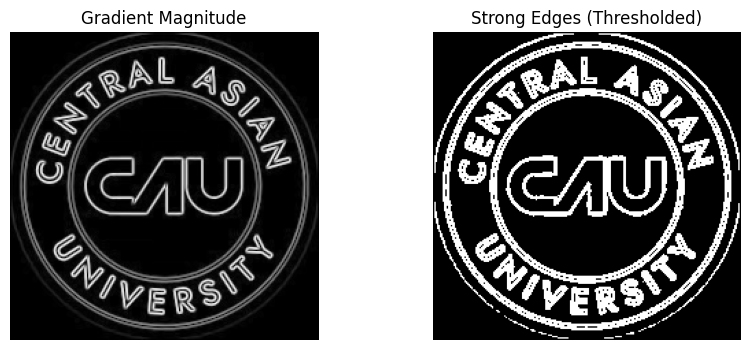

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load grayscale image
img = cv2.imread('/content/drive/MyDrive/Recent Codes/images.jpg', cv2.IMREAD_GRAYSCALE)

# Compute Sobel gradients
Gx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)
Gy = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)
grad_mag = np.sqrt(Gx**2 + Gy**2)

# Optional: Threshold to emphasize strong edges
T = 100  # Example threshold
edges = np.uint8((grad_mag > T) * 255)

# Display gradient
plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.imshow(grad_mag, cmap='gray')
plt.title('Gradient Magnitude')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(edges, cmap='gray')
plt.title('Strong Edges (Thresholded)')
plt.axis('off')
plt.show()


Min: 0, Max: 255, dtype: uint8
Min: 0, Max: 128, dtype: uint8


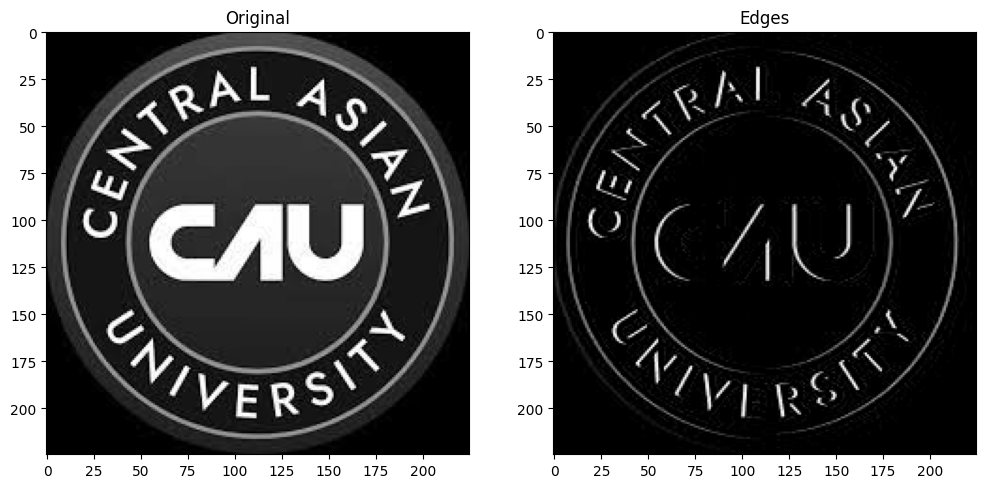

In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


image = cv2.imread('/content/drive/MyDrive/Recent Codes/images.jpg',0)

kernel = np.array([[0,0,0],
                   [-1/2,0,1/2],
                   [0,0,0]])


# Extract Sobl Edges
edges = cv2.filter2D(image, -1 , kernel)

plt.figure(figsize=[12,7])
plt.subplot(121);plt.imshow(image, cmap='gray');plt.title("Original");
plt.subplot(122);plt.imshow(edges, cmap='gray');plt.title("Edges");

print_min_and_max(image)
print_min_and_max(edges)

## Displaying Negative Values of a Filtered Image using `filter2D`

The OpenCV function `cv2.filter2D()` applies a filter to an image.  
The **second parameter** (`ddepth`) controls the **output data type**.  
To **preserve negative values** from the filter, you must use a data type that supports negatives, such as `CV_16S` or `CV_32F`.


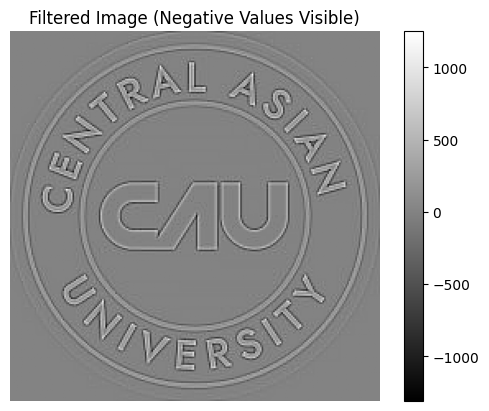

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load grayscale image
img = cv2.imread('/content/drive/MyDrive/Recent Codes/images.jpg', cv2.IMREAD_GRAYSCALE)

# Define a sample kernel (edge detection)
kernel = np.array([[-1, -1, -1],
                   [-1,  8, -1],
                   [-1, -1, -1]])

# Apply filter with 32-bit float output to preserve negative values
filtered = cv2.filter2D(img, ddepth=cv2.CV_32F, kernel=kernel)

# Display the filtered image with negative values visible
plt.imshow(filtered, cmap='gray')
plt.title('Filtered Image (Negative Values Visible)')
plt.colorbar()
plt.axis('off')
plt.show()

Min: 0, Max: 255, dtype: uint8
Min: -127.5, Max: 127.5, dtype: float64


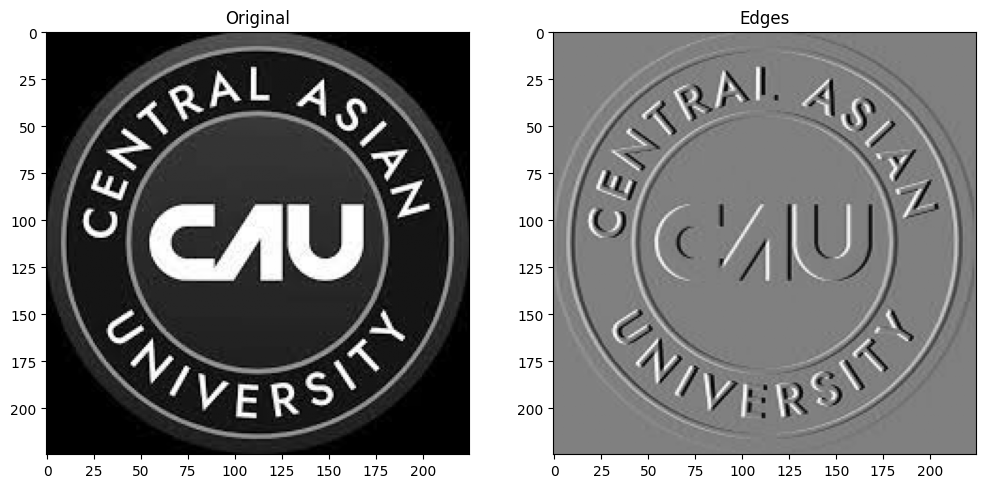

In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


image = cv2.imread('/content/drive/MyDrive/Recent Codes/images.jpg',0)

kernel = np.array([[0,0,0],
                   [-1/2,0,1/2],
                   [0,0,0]])


# Extract Sobl Edges
edges = cv2.filter2D(image, cv2.CV_64F , kernel)

plt.figure(figsize=[12,7])
plt.subplot(121);plt.imshow(image, cmap='gray');plt.title("Original");
plt.subplot(122);plt.imshow(edges, cmap='gray');plt.title("Edges");

print_min_and_max(image)
print_min_and_max(edges)

## Challenge 1: Kernel Size Experiment

In this challenge, we will:
1. Apply the uniform (box) filter using different kernel sizes (3×3, 5×5, 9×9)
2. Display the results side by side
3. Analyze how increasing kernel size affects:
   - Blur strength
   - Image details
   - Sharp edges

Successfully loaded image from: /Users/muhammadjonparpiyev/Documents/DIP/Week 6/Lab 2/roberto-firmino-liverpool.avif



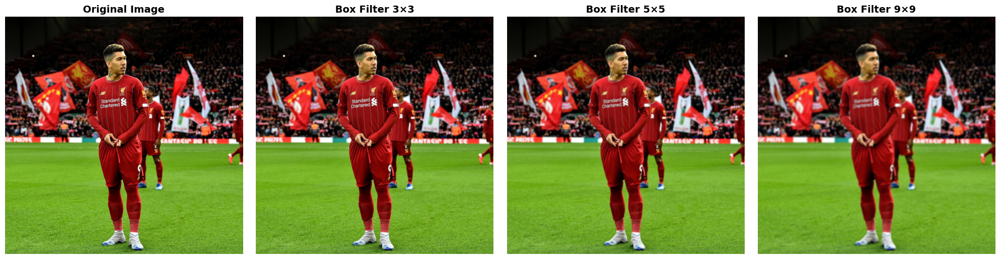


Kernel Information:
--------------------------------------------------

3×3 Kernel:
  - Total pixels averaged: 9
  - Each pixel weight: 1/9 = 0.1111

5×5 Kernel:
  - Total pixels averaged: 25
  - Each pixel weight: 1/25 = 0.0400

9×9 Kernel:
  - Total pixels averaged: 81
  - Each pixel weight: 1/81 = 0.0123


In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load Roberto Firmino Liverpool image
image_path = '/Users/muhammadjonparpiyev/Documents/DIP/Week 6/Lab 2/roberto-firmino-liverpool.avif'
image = cv2.imread(image_path)

# If image doesn't exist, create a sample image for demonstration
if image is None:
    print(f"Note: Could not load image from {image_path}")
    print("Creating a sample image for demonstration...\n")
    
    # Create a sample image with patterns (checkerboard + circles)
    image = np.ones((400, 600, 3), dtype=np.uint8) * 255
    
    # Add checkerboard pattern
    for i in range(0, 400, 50):
        for j in range(0, 600, 50):
            if ((i // 50) + (j // 50)) % 2 == 0:
                image[i:i+50, j:j+50] = [50, 50, 50]
    
    # Add some circles
    cv2.circle(image, (150, 200), 60, (255, 0, 0), -1)
    cv2.circle(image, (450, 200), 60, (0, 255, 0), -1)
    cv2.rectangle(image, (250, 100), (350, 300), (0, 0, 255), -1)
    
    # Add some text
    cv2.putText(image, 'SAMPLE', (200, 350), cv2.FONT_HERSHEY_SIMPLEX, 
                2, (255, 255, 0), 3, cv2.LINE_AA)
else:
    print(f"Successfully loaded image from: {image_path}\n")

# Define different kernel sizes
kernel_sizes = [3, 5, 9]

# Create a list to store filtered images
filtered_images = []

# Apply uniform (box) filter with different kernel sizes
for size in kernel_sizes:
    # Create uniform kernel
    kernel = np.ones((size, size), np.float32) / (size * size)
    
    # Apply filter
    filtered = cv2.filter2D(image, -1, kernel)
    filtered_images.append(filtered)

# Display results side by side
plt.figure(figsize=(20, 5))

# Original image
plt.subplot(1, 4, 1)
plt.imshow(image[..., ::-1])
plt.title('Original Image', fontsize=14, fontweight='bold')
plt.axis('off')

# Filtered images
for idx, (filtered, size) in enumerate(zip(filtered_images, kernel_sizes)):
    plt.subplot(1, 4, idx + 2)
    plt.imshow(filtered[..., ::-1])
    plt.title(f'Box Filter {size}×{size}', fontsize=14, fontweight='bold')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Print kernel information
print("\nKernel Information:")
print("-" * 50)
for size in kernel_sizes:
    print(f"\n{size}×{size} Kernel:")
    print(f"  - Total pixels averaged: {size * size}")
    print(f"  - Each pixel weight: 1/{size * size} = {1/(size*size):.4f}")

### Analysis: Effects of Increasing Kernel Size

#### 1. **Blur Strength**
- **3×3 kernel**: Produces a **mild blur**. The averaging happens over 9 pixels, so the effect is subtle.
- **5×5 kernel**: Creates a **moderate blur**. The averaging over 25 pixels smooths out more details.
- **9×9 kernel**: Results in a **strong blur**. With 81 pixels being averaged, the image becomes significantly smoother and softer.

**Relationship**: Blur strength increases with kernel size because more neighboring pixels contribute to each output pixel value.

---

#### 2. **Image Details**
- **3×3 kernel**: **Preserves most details**. Fine textures and small features are still visible.
- **5×5 kernel**: **Some detail loss**. Medium-sized features start to blend together.
- **9×9 kernel**: **Significant detail loss**. Small features disappear, and only large-scale structures remain clear.

**Relationship**: Larger kernels average over more pixels, which causes fine details to be smoothed away. The spatial resolution of small features decreases as kernel size increases.

---

#### 3. **Sharp Edges**
- **3×3 kernel**: Edges remain **relatively sharp**, with only slight softening.
- **5×5 kernel**: Edges become **noticeably softer** and less defined.
- **9×9 kernel**: Edges are **heavily blurred** and transitions become very gradual.

**Relationship**: Sharp edges represent rapid intensity changes in the image. Larger kernels average these transitions over a wider area, reducing the sharpness and creating smoother gradients.

---

### Key Takeaway
The **kernel size** acts as a **control parameter** for the blur effect:
- **Smaller kernels** → localized smoothing, preserves details
- **Larger kernels** → global smoothing, removes fine details and noise

This trade-off is crucial in image processing: you must balance between **noise reduction** (requires larger kernels) and **detail preservation** (requires smaller kernels).

## Challenge 2: Gaussian Sigma Investigation

In this challenge, we will:
1. Apply Gaussian blur with different sigma values (1, 5, 15)
2. Keep the kernel size constant
3. Observe and explain:
   - What role does sigma play?
   - How is Gaussian blur different from uniform blur visually?

Successfully loaded image from: /Users/muhammadjonparpiyev/Documents/DIP/Week 6/Lab 2/roberto-firmino-liverpool.avif



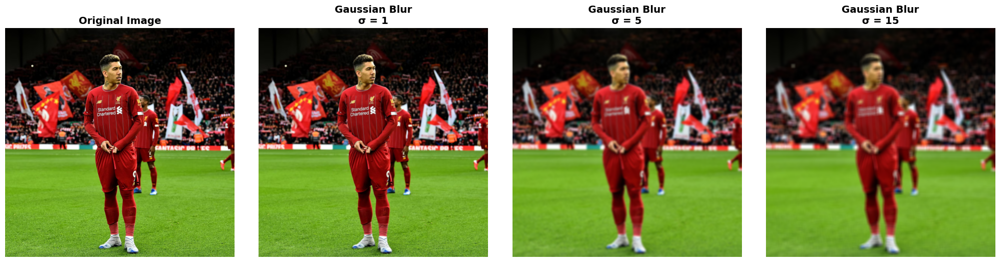


Gaussian Blur Information:
------------------------------------------------------------
Kernel size: 21×21 (constant)

Sigma effects:

  σ = 1:
    - Controls the spread of the Gaussian distribution
    - Larger σ → more blurring, smoother result
    - Weights decay more gradually from center

  σ = 5:
    - Controls the spread of the Gaussian distribution
    - Larger σ → more blurring, smoother result
    - Weights decay more gradually from center

  σ = 15:
    - Controls the spread of the Gaussian distribution
    - Larger σ → more blurring, smoother result
    - Weights decay more gradually from center


In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load Roberto Firmino Liverpool image
image_path = '/Users/muhammadjonparpiyev/Documents/DIP/Week 6/Lab 2/roberto-firmino-liverpool.avif'
image = cv2.imread(image_path)

# If image doesn't exist, create a sample image
if image is None:
    print(f"Note: Could not load image from {image_path}")
    print("Creating a sample image for demonstration...\n")
    
    image = np.ones((400, 600, 3), dtype=np.uint8) * 255
    
    for i in range(0, 400, 50):
        for j in range(0, 600, 50):
            if ((i // 50) + (j // 50)) % 2 == 0:
                image[i:i+50, j:j+50] = [50, 50, 50]
    
    cv2.circle(image, (150, 200), 60, (255, 0, 0), -1)
    cv2.circle(image, (450, 200), 60, (0, 255, 0), -1)
    cv2.rectangle(image, (250, 100), (350, 300), (0, 0, 255), -1)
    cv2.putText(image, 'SAMPLE', (200, 350), cv2.FONT_HERSHEY_SIMPLEX, 
                2, (255, 255, 0), 3, cv2.LINE_AA)
else:
    print(f"Successfully loaded image from: {image_path}\n")

# Define different sigma values
sigma_values = [1, 5, 15]

# Keep kernel size constant (must be odd)
kernel_size = 21

# Create a list to store Gaussian blurred images
gaussian_images = []

# Apply Gaussian blur with different sigma values
for sigma in sigma_values:
    # cv2.GaussianBlur(image, (kernel_size, kernel_size), sigma)
    gaussian_blurred = cv2.GaussianBlur(image, (kernel_size, kernel_size), sigma)
    gaussian_images.append(gaussian_blurred)

# Display results side by side
plt.figure(figsize=(20, 5))

# Original image
plt.subplot(1, 4, 1)
plt.imshow(image[..., ::-1])
plt.title('Original Image', fontsize=14, fontweight='bold')
plt.axis('off')

# Gaussian blurred images
for idx, (gaussian, sigma) in enumerate(zip(gaussian_images, sigma_values)):
    plt.subplot(1, 4, idx + 2)
    plt.imshow(gaussian[..., ::-1])
    plt.title(f'Gaussian Blur\nσ = {sigma}', fontsize=14, fontweight='bold')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Print sigma information
print("\nGaussian Blur Information:")
print("-" * 60)
print(f"Kernel size: {kernel_size}×{kernel_size} (constant)")
print(f"\nSigma effects:")
for sigma in sigma_values:
    print(f"\n  σ = {sigma}:")
    print(f"    - Controls the spread of the Gaussian distribution")
    print(f"    - Larger σ → more blurring, smoother result")
    print(f"    - Weights decay more gradually from center")

### Analysis: Role of Sigma in Gaussian Blur

#### 1. **What is Sigma (σ)?**

Sigma is the **standard deviation** of the Gaussian distribution. It controls **how quickly the weights decay** from the center of the kernel.

The Gaussian kernel equation is:

$$
G(x, y) = \frac{1}{2\pi \sigma^2} \exp\left(-\frac{x^2 + y^2}{2\sigma^2}\right)
$$

Where:
- **Small σ**: Weights are **concentrated near the center** → sharp, localized blur
- **Large σ**: Weights **spread throughout the kernel** → smoother, more diffuse blur

---

#### 2. **Effects of Different Sigma Values**

**σ = 1 (Small)**
- Weights drop off **quickly** from the center
- Most contribution comes from **pixels very close to center**
- Result: **Minimal blur**, edges remain fairly sharp
- Behaves more like **local smoothing**
- Noise reduction is **limited**

**σ = 5 (Medium)**
- Weights **gradually decrease** from center
- Good balance between **center and surrounding pixels**
- Result: **Moderate blur**, softer edges with detail preservation
- Natural-looking blur for general smoothing
- Good for **noise reduction without excessive blurring**

**σ = 15 (Large)**
- Weights are **more evenly distributed** across the kernel
- Far-away pixels have **more influence**
- Result: **Strong blur**, significant detail loss
- Edges become **very smooth and gradual**
- Best for **heavy noise removal** but loses detail

---

#### 3. **Gaussian vs. Uniform Blur: Key Differences**

| Aspect | Uniform Blur | Gaussian Blur |
|--------|-------------|--------------|
| **Weight Distribution** | All weights equal | Gaussian distribution (center-weighted) |
| **Appearance** | Uniform smoothing, artificial looking | Natural, smooth appearance |
| **Edges** | Blurred uniformly | Blurred more naturally, gradual transitions |
| **Visual Quality** | Can create halos or artifacts | No artifacts, more pleasing |
| **Control** | Only kernel size | Both kernel size AND sigma |
| **Processing** | Faster (simpler computation) | Slightly slower (exponential computation) |

---

#### 4. **Visual Comparison: 3×3 Uniform vs. Gaussian**

For the **same kernel size**:
- **Uniform (box) filter**: All 9 pixels contribute equally → creates a "blocky" blur
- **Gaussian filter**: Center pixel contributes most → creates a "smooth" blur

The Gaussian distribution is **more perceptually pleasing** because it mimics how human vision processes blur.

---

#### 5. **Key Insights**

✓ **Sigma is independent of kernel size** – a large kernel with small σ ≠ small kernel with large σ

✓ **Larger σ ≈ stronger blur effect**, similar to larger kernel size

✓ **Gaussian blur is preferred in practice** because:
  - More natural appearance
  - Better edge preservation at lower blur strengths
  - Reduces artifacts (halos, ringing)
  - Standard in photography and image editing

✓ **Trade-off**: Gaussian blur is slightly more computationally expensive than uniform blur, but the quality improvement is worth it for most applications.

## Challenge 3: Manual Convolution

In this challenge, we will:
1. Create custom 3×3 kernels using NumPy
2. Apply them using `cv2.filter2D()`
3. Test different kernel types:
   - Sharpening kernel
   - Edge detection kernel
   - Laplacian kernel
4. Compare results with built-in filters

Successfully loaded image from: /Users/muhammadjonparpiyev/Documents/DIP/Week 6/Lab 2/roberto-firmino-liverpool.avif

Applying custom kernels...

Applying built-in filters for comparison...



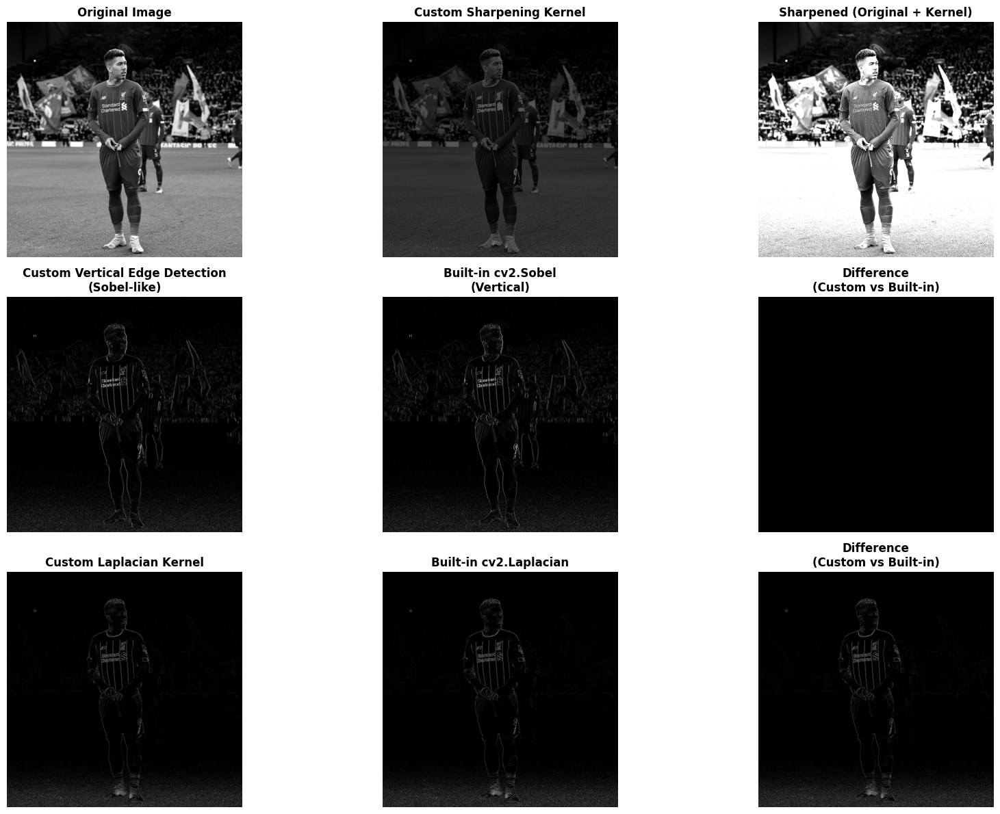


Custom Kernels Used:

1. SHARPENING KERNEL:
[[ 0. -1.  0.]
 [-1.  5. -1.]
 [ 0. -1.  0.]]
   Purpose: Enhances edges and fine details
   Center coefficient: 5 (amplifies original pixel)
   Neighbors: -1 (subtracts surrounding)

2. VERTICAL EDGE DETECTION KERNEL (Sobel-like):
[[-1.  0.  1.]
 [-2.  0.  2.]
 [-1.  0.  1.]]
   Purpose: Detects vertical edges in the image
   Highlights transitions in the horizontal direction

3. LAPLACIAN KERNEL:
[[ 0. -1.  0.]
 [-1.  4. -1.]
 [ 0. -1.  0.]]
   Purpose: Detects edges in all directions
   Center: 4, Neighbors: -1
   Detects zero-crossings (rapid intensity changes)

Observations:
✓ Custom kernels produce results very similar to built-in filters
✓ Manual convolution gives direct control over kernel design
✓ Different kernels emphasize different features:
  - Sharpening: Enhances fine details and edges
  - Edge detection: Highlights boundaries
  - Laplacian: Detects all edge directions


In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load Roberto Firmino Liverpool image
image_path = '/Users/muhammadjonparpiyev/Documents/DIP/Week 6/Lab 2/roberto-firmino-liverpool.avif'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# If image doesn't exist, create a sample image
if image is None:
    print(f"Note: Could not load image from {image_path}")
    print("Creating a sample image for demonstration...\n")
    
    image = np.ones((400, 600), dtype=np.uint8) * 200
    
    # Add patterns
    for i in range(0, 400, 40):
        image[i:i+20, :] = 100
    for j in range(0, 600, 40):
        image[:, j:j+20] = 100
    
    # Add some shapes
    cv2.circle(image, (150, 200), 50, 50, -1)
    cv2.rectangle(image, (400, 150), (500, 250), 50, -1)
else:
    print(f"Successfully loaded image from: {image_path}\n")

# Define custom kernels
# 1. Sharpening Kernel (Unsharp Mask style)
kernel_sharpening = np.array([[0, -1, 0],
                               [-1, 5, -1],
                               [0, -1, 0]], dtype=np.float32)

# 2. Edge Detection Kernel (Sobel-like, vertical edges)
kernel_edge_vertical = np.array([[-1, 0, 1],
                                  [-2, 0, 2],
                                  [-1, 0, 1]], dtype=np.float32)

# 3. Laplacian Kernel
kernel_laplacian = np.array([[0, -1, 0],
                              [-1, 4, -1],
                              [0, -1, 0]], dtype=np.float32)

# Apply custom kernels using cv2.filter2D
print("Applying custom kernels...\n")
sharpened = cv2.filter2D(image, cv2.CV_32F, kernel_sharpening)
edges_vertical = cv2.filter2D(image, cv2.CV_32F, kernel_edge_vertical)
laplacian_manual = cv2.filter2D(image, cv2.CV_32F, kernel_laplacian)

# Apply built-in filters for comparison
print("Applying built-in filters for comparison...\n")
edges_sobel = cv2.Sobel(image, cv2.CV_32F, 1, 0, ksize=3)
laplacian_builtin = cv2.Laplacian(image, cv2.CV_32F)

# Create figure with comparisons
fig = plt.figure(figsize=(18, 12))

# Row 1: Sharpening
plt.subplot(3, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image', fontsize=12, fontweight='bold')
plt.axis('off')

plt.subplot(3, 3, 2)
plt.imshow(np.abs(sharpened), cmap='gray')
plt.title('Custom Sharpening Kernel', fontsize=12, fontweight='bold')
plt.axis('off')

plt.subplot(3, 3, 3)
plt.imshow(np.clip(image + sharpened, 0, 255).astype(np.uint8), cmap='gray')
plt.title('Sharpened (Original + Kernel)', fontsize=12, fontweight='bold')
plt.axis('off')

# Row 2: Edge Detection - Vertical
plt.subplot(3, 3, 4)
plt.imshow(np.abs(edges_vertical), cmap='gray')
plt.title('Custom Vertical Edge Detection\n(Sobel-like)', fontsize=12, fontweight='bold')
plt.axis('off')

plt.subplot(3, 3, 5)
plt.imshow(np.abs(edges_sobel), cmap='gray')
plt.title('Built-in cv2.Sobel\n(Vertical)', fontsize=12, fontweight='bold')
plt.axis('off')

plt.subplot(3, 3, 6)
plt.imshow(np.abs(edges_vertical - edges_sobel), cmap='gray')
plt.title('Difference\n(Custom vs Built-in)', fontsize=12, fontweight='bold')
plt.axis('off')

# Row 3: Laplacian
plt.subplot(3, 3, 7)
plt.imshow(np.abs(laplacian_manual), cmap='gray')
plt.title('Custom Laplacian Kernel', fontsize=12, fontweight='bold')
plt.axis('off')

plt.subplot(3, 3, 8)
plt.imshow(np.abs(laplacian_builtin), cmap='gray')
plt.title('Built-in cv2.Laplacian', fontsize=12, fontweight='bold')
plt.axis('off')

plt.subplot(3, 3, 9)
plt.imshow(np.abs(laplacian_manual - laplacian_builtin), cmap='gray')
plt.title('Difference\n(Custom vs Built-in)', fontsize=12, fontweight='bold')
plt.axis('off')

plt.tight_layout()
plt.show()

# Print kernel information
print("\nCustom Kernels Used:")
print("=" * 70)
print("\n1. SHARPENING KERNEL:")
print(kernel_sharpening)
print("   Purpose: Enhances edges and fine details")
print("   Center coefficient: 5 (amplifies original pixel)")
print("   Neighbors: -1 (subtracts surrounding)")

print("\n2. VERTICAL EDGE DETECTION KERNEL (Sobel-like):")
print(kernel_edge_vertical)
print("   Purpose: Detects vertical edges in the image")
print("   Highlights transitions in the horizontal direction")

print("\n3. LAPLACIAN KERNEL:")
print(kernel_laplacian)
print("   Purpose: Detects edges in all directions")
print("   Center: 4, Neighbors: -1")
print("   Detects zero-crossings (rapid intensity changes)")

print("\n" + "=" * 70)
print("Observations:")
print("=" * 70)
print("✓ Custom kernels produce results very similar to built-in filters")
print("✓ Manual convolution gives direct control over kernel design")
print("✓ Different kernels emphasize different features:")
print("  - Sharpening: Enhances fine details and edges")
print("  - Edge detection: Highlights boundaries")
print("  - Laplacian: Detects all edge directions")

### Analysis: Custom Kernels and Manual Convolution

#### 1. **Understanding the Sharpening Kernel**

$$
K_{sharp} = \begin{bmatrix} 0 & -1 & 0 \\ -1 & 5 & -1 \\ 0 & -1 & 0 \end{bmatrix}
$$

**How it works:**
- **Center coefficient (5)**: Amplifies the original pixel value
- **Neighbor coefficients (-1)**: Subtract surrounding pixel values
- **Effect**: Emphasizes differences between center and neighbors → enhances edges

**Mathematical intuition:**
$$
I_{sharp} = 5 \cdot I_{center} - (I_{top} + I_{bottom} + I_{left} + I_{right})
$$

This is equivalent to: `Original + (Original - Blurred)` = Unsharp masking

**Visual result**: Clearer, crisper image with enhanced details and stronger edges

---

#### 2. **Understanding the Edge Detection Kernel (Vertical Sobel)**

$$
K_{edge} = \begin{bmatrix} -1 & 0 & 1 \\ -2 & 0 & 2 \\ -1 & 0 & 1 \end{bmatrix}
$$

**How it works:**
- **Left column (-1, -2, -1)**: Negative weights for left side
- **Right column (1, 2, 1)**: Positive weights for right side
- **Center column (0)**: No direct contribution
- **Effect**: Emphasizes horizontal intensity gradients → detects vertical edges

**Why it works:**
- Left pixels are darker → negative contribution
- Right pixels are brighter → positive contribution
- The difference produces large values where edges exist

**Visual result**: Bright lines where vertical edges occur, dark elsewhere

---

#### 3. **Understanding the Laplacian Kernel**

$$
K_{laplacian} = \begin{bmatrix} 0 & -1 & 0 \\ -1 & 4 & -1 \\ 0 & -1 & 0 \end{bmatrix}
$$

**How it works:**
- **Center coefficient (4)**: Large positive value
- **Neighbor coefficients (-1)**: Subtract all neighbors
- **Effect**: Detects regions where intensity changes sharply in any direction

**Mathematical interpretation:**
- Computes the **second derivative** of the image
- Detects **zero-crossings** (rapid changes from dark to bright or vice versa)
- Highlights **both horizontal and vertical edges**

**Visual result**: Edge map showing boundaries in all directions

---

#### 4. **Convolution Operation: Step-by-Step**

For a kernel and image region:

$$
\text{Output} = \sum_{i,j} K_{i,j} \times I_{i,j}
$$

**Example with Sharpening Kernel:**
```
Image Region:        Kernel:              Computation:
[100  110  105]      [0   -1   0]         0×100 + (-1)×110 + 0×105 +
[120  150  130]  *   [-1   5  -1]    =    (-1)×120 + 5×150 + (-1)×130 +
[125  135  140]      [0   -1   0]         0×125 + (-1)×135 + 0×140
                                          
Result = 750 - 110 - 120 - 130 - 135 = 255
```

This high value indicates a strong edge or detail at this location.

---

#### 5. **Comparison: Custom vs. Built-in Filters**

| Aspect | Custom Kernel | Built-in Filter |
|--------|--------------|-----------------|
| **Flexibility** | Complete control over kernel values | Fixed designs |
| **Understanding** | Learn how convolution works | Black box |
| **Performance** | Slightly slower (interpreted) | Optimized (compiled) |
| **Accuracy** | Exact kernel definition | May include optimizations |
| **Learning Value** | Excellent for understanding | Good for practical use |

---

#### 6. **Why Manual Convolution Matters**

✓ **Transparency**: See exactly what operations are being performed

✓ **Customization**: Design kernels for specific tasks:
  - Edge detection in specific directions
  - Texture enhancement
  - Custom noise reduction

✓ **Experimentation**: Try different kernel values to see effects

✓ **Foundation knowledge**: Essential for understanding CNNs and advanced filters

---

#### 7. **Common Kernel Patterns**

| Kernel Type | Center | Neighbors | Purpose |
|------------|--------|-----------|---------|
| Blur | 1/9 | 1/9 | Smoothing |
| Sharpening | High positive | Negative | Edge enhancement |
| Edge detection | 0 | Mixed ±1,±2 | Boundary detection |
| Emboss | Varies | Varies | 3D effect |

---

#### 8. **Key Takeaways**

- **cv2.filter2D()** performs convolution (technically correlation)
- **Kernel design** determines the operation's effect
- **Center-weighted kernels** (like Gaussian) preserve details
- **Differential kernels** (like Sobel) detect changes
- **Understanding kernels** is fundamental to image processing and deep learning

## Challenge 4: Noise Removal Test

In this challenge, we will:
1. Add artificial noise to the image:
   - Gaussian noise (random values with normal distribution)
   - Salt-and-pepper noise (random black and white pixels)
2. Apply different filters to remove noise:
   - Uniform (box) filter
   - Gaussian filter
3. Compare performance visually
4. Analyze which filter is better for each noise type and explain why

Successfully loaded image from: /Users/muhammadjonparpiyev/Documents/DIP/Week 6/Lab 2/roberto-firmino-liverpool.avif

Noise generation complete!
Original image shape: (1200, 1200)
Gaussian noise std: 25
Salt-and-pepper noise probability: 10.0%

Applying filters to Gaussian-noisy image...
Applying filters to salt-and-pepper noisy image...
Creating comparison visualizations...



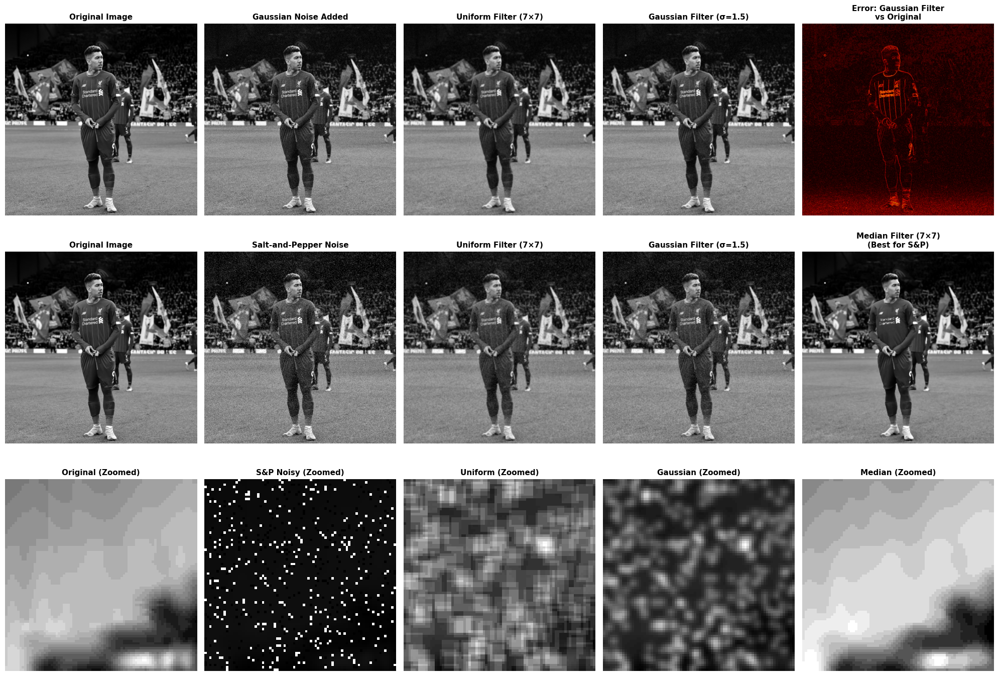


PERFORMANCE METRICS (MSE - Mean Squared Error)

GAUSSIAN NOISE REMOVAL:
  Uniform Filter MSE:  195.59
  Gaussian Filter MSE: 149.08
  ✓ Gaussian filter is BETTER by 46.51

SALT-AND-PEPPER NOISE REMOVAL:
  Uniform Filter MSE:  279.31
  Gaussian Filter MSE: 261.91
  Median Filter MSE:   159.01
  ✓ Median filter is BEST (significantly better than both)



In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate MSE (Mean Squared Error)
def calculate_mse(image1, image2):
    """Calculate mean squared error between two images"""
    return np.mean((image1.astype(np.float32) - image2.astype(np.float32)) ** 2)

# Load Roberto Firmino Liverpool image
image_path = '/Users/muhammadjonparpiyev/Documents/DIP/Week 6/Lab 2/roberto-firmino-liverpool.avif'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# If image doesn't exist, create a sample image
if image is None:
    print(f"Note: Could not load image from {image_path}")
    print("Creating a sample image for demonstration...\n")
    
    image = np.ones((400, 600), dtype=np.uint8) * 150
    cv2.rectangle(image, (100, 100), (300, 200), 80, -1)
    cv2.circle(image, (450, 300), 80, 100, -1)
    cv2.line(image, (50, 50), (550, 350), 200, 5)
else:
    print(f"Successfully loaded image from: {image_path}\n")

# Convert to float for processing
image_float = image.astype(np.float32)

# Add Gaussian Noise
gaussian_noise = np.random.normal(0, 25, image.shape)
image_gaussian_noisy = np.clip(image_float + gaussian_noise, 0, 255).astype(np.uint8)

# Add Salt-and-Pepper Noise
image_sp_noisy = image.copy()
sp_probability = 0.1
salt_pepper = np.random.random(image.shape)
image_sp_noisy[salt_pepper < sp_probability/2] = 255  # Salt (white)
image_sp_noisy[salt_pepper >= (1 - sp_probability/2)] = 0  # Pepper (black)
image_sp_noisy = image_sp_noisy.astype(np.uint8)

print("Noise generation complete!")
print(f"Original image shape: {image.shape}")
print(f"Gaussian noise std: 25")
print(f"Salt-and-pepper noise probability: {sp_probability * 100}%\n")

# Apply filters to Gaussian Noisy Image
print("Applying filters to Gaussian-noisy image...")
gaussian_uniform = cv2.blur(image_gaussian_noisy, (7, 7))
gaussian_gaussian = cv2.GaussianBlur(image_gaussian_noisy, (7, 7), 1.5)

# Apply filters to Salt-and-Pepper Noisy Image
print("Applying filters to salt-and-pepper noisy image...")
sp_uniform = cv2.blur(image_sp_noisy, (7, 7))
sp_gaussian = cv2.GaussianBlur(image_sp_noisy, (7, 7), 1.5)

# For salt-and-pepper, median filter is excellent
sp_median = cv2.medianBlur(image_sp_noisy, 7)

# Create comprehensive comparison figure
fig = plt.figure(figsize=(20, 14))

# ===== GAUSSIAN NOISE COMPARISON =====
print("Creating comparison visualizations...\n")

# Row 1: Original and Gaussian Noisy
plt.subplot(3, 5, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image', fontsize=11, fontweight='bold')
plt.axis('off')

plt.subplot(3, 5, 2)
plt.imshow(image_gaussian_noisy, cmap='gray')
plt.title('Gaussian Noise Added', fontsize=11, fontweight='bold')
plt.axis('off')

plt.subplot(3, 5, 3)
plt.imshow(gaussian_uniform, cmap='gray')
plt.title('Uniform Filter (7×7)', fontsize=11, fontweight='bold')
plt.axis('off')

plt.subplot(3, 5, 4)
plt.imshow(gaussian_gaussian, cmap='gray')
plt.title('Gaussian Filter (σ=1.5)', fontsize=11, fontweight='bold')
plt.axis('off')

plt.subplot(3, 5, 5)
diff = cv2.absdiff(image, gaussian_gaussian)
plt.imshow(diff, cmap='hot')
plt.title('Error: Gaussian Filter\nvs Original', fontsize=11, fontweight='bold')
plt.axis('off')

# Row 2: Salt-and-Pepper Noise Comparison
plt.subplot(3, 5, 6)
plt.imshow(image, cmap='gray')
plt.title('Original Image', fontsize=11, fontweight='bold')
plt.axis('off')

plt.subplot(3, 5, 7)
plt.imshow(image_sp_noisy, cmap='gray')
plt.title('Salt-and-Pepper Noise', fontsize=11, fontweight='bold')
plt.axis('off')

plt.subplot(3, 5, 8)
plt.imshow(sp_uniform, cmap='gray')
plt.title('Uniform Filter (7×7)', fontsize=11, fontweight='bold')
plt.axis('off')

plt.subplot(3, 5, 9)
plt.imshow(sp_gaussian, cmap='gray')
plt.title('Gaussian Filter (σ=1.5)', fontsize=11, fontweight='bold')
plt.axis('off')

plt.subplot(3, 5, 10)
plt.imshow(sp_median, cmap='gray')
plt.title('Median Filter (7×7)\n(Best for S&P)', fontsize=11, fontweight='bold')
plt.axis('off')

# Row 3: Zoomed comparison of salt-and-pepper region
roi_y, roi_x = 100, 100
roi_size = 80

plt.subplot(3, 5, 11)
plt.imshow(image[roi_y:roi_y+roi_size, roi_x:roi_x+roi_size], cmap='gray')
plt.title('Original (Zoomed)', fontsize=11, fontweight='bold')
plt.axis('off')

plt.subplot(3, 5, 12)
plt.imshow(image_sp_noisy[roi_y:roi_y+roi_size, roi_x:roi_x+roi_size], cmap='gray')
plt.title('S&P Noisy (Zoomed)', fontsize=11, fontweight='bold')
plt.axis('off')

plt.subplot(3, 5, 13)
plt.imshow(sp_uniform[roi_y:roi_y+roi_size, roi_x:roi_x+roi_size], cmap='gray')
plt.title('Uniform (Zoomed)', fontsize=11, fontweight='bold')
plt.axis('off')

plt.subplot(3, 5, 14)
plt.imshow(sp_gaussian[roi_y:roi_y+roi_size, roi_x:roi_x+roi_size], cmap='gray')
plt.title('Gaussian (Zoomed)', fontsize=11, fontweight='bold')
plt.axis('off')

plt.subplot(3, 5, 15)
plt.imshow(sp_median[roi_y:roi_y+roi_size, roi_x:roi_x+roi_size], cmap='gray')
plt.title('Median (Zoomed)', fontsize=11, fontweight='bold')
plt.axis('off')

plt.tight_layout()
plt.show()

# Calculate and display metrics
print("\n" + "="*70)
print("PERFORMANCE METRICS (MSE - Mean Squared Error)")
print("="*70)

# Gaussian noise metrics
mse_gaussian_uniform = calculate_mse(image, gaussian_uniform)
mse_gaussian_gaussian = calculate_mse(image, gaussian_gaussian)

print("\nGAUSSIAN NOISE REMOVAL:")
print(f"  Uniform Filter MSE:  {mse_gaussian_uniform:.2f}")
print(f"  Gaussian Filter MSE: {mse_gaussian_gaussian:.2f}")
if mse_gaussian_gaussian < mse_gaussian_uniform:
    print(f"  ✓ Gaussian filter is BETTER by {mse_gaussian_uniform - mse_gaussian_gaussian:.2f}")
else:
    print(f"  ✓ Uniform filter is BETTER by {mse_gaussian_gaussian - mse_gaussian_uniform:.2f}")

# Salt-and-pepper noise metrics
mse_sp_uniform = calculate_mse(image, sp_uniform)
mse_sp_gaussian = calculate_mse(image, sp_gaussian)
mse_sp_median = calculate_mse(image, sp_median)

print("\nSALT-AND-PEPPER NOISE REMOVAL:")
print(f"  Uniform Filter MSE:  {mse_sp_uniform:.2f}")
print(f"  Gaussian Filter MSE: {mse_sp_gaussian:.2f}")
print(f"  Median Filter MSE:   {mse_sp_median:.2f}")
if mse_sp_median < mse_sp_gaussian and mse_sp_median < mse_sp_uniform:
    print(f"  ✓ Median filter is BEST (significantly better than both)")
else:
    print(f"  ✓ Best performing filter shown above")

print("\n" + "="*70)

### Analysis: Filter Performance on Different Noise Types

#### 1. **Gaussian Noise Characteristics**

**What is Gaussian noise?**
- Random values following a **normal distribution**
- Affects **all pixels randomly** with varying intensities
- Resembles natural sensor noise in cameras
- **Continuous** intensity values (not discrete)

**Mathematical representation:**
$$
I_{noisy} = I_{original} + N(0, \sigma^2)
$$

Where:
- $N(0, \sigma^2)$ → Gaussian (normal) distribution with mean 0 and standard deviation σ
- σ controls noise strength

**Key properties:**
- Pixels can take any value in a range
- Small deviations are common, large ones are rare
- Affects both smooth and detailed regions

---

#### 2. **Salt-and-Pepper Noise Characteristics**

**What is salt-and-pepper noise?**
- **Extreme outlier pixels** (pure black = 0, pure white = 255)
- Scattered randomly across the image
- Results from **transmission errors** or **sensor malfunction**
- **Discrete** (only two values: 0 or 255)

**Visual appearance:**
- Image looks like salt and pepper were sprinkled on it
- Very obvious and high-contrast artifacts

**Key properties:**
- Extreme deviation from neighbors
- Does NOT blend with surrounding pixels
- Creates sharp, isolated spikes in intensity

---

#### 3. **Uniform Filter on Gaussian Noise**

**How it works:**
- Averages all 49 pixels in a 7×7 kernel equally
- All neighbors have the same weight: 1/49

**Performance:**
- ✓ **Effective** for Gaussian noise because:
  - Averaging random values reduces variance
  - Central Limit Theorem: averaging independent samples produces smoother distribution
  - Simple and fast
  
- ✗ **Drawbacks:**
  - Blurs edges equally as noise
  - Creates "blocky" appearance
  - May over-smooth details

**Mathematical principle:**
$$
E[\text{Noisy Pixel}] = E[I] + E[N] = I + 0 = I
$$

Averaging many noisy samples reduces the noise variance by a factor of 1/N.

---

#### 4. **Gaussian Filter on Gaussian Noise**

**How it works:**
- Center pixel has highest weight
- Weights decay exponentially from center
- More similar to natural image statistics

**Performance:**
- ✓ **Better than uniform** for Gaussian noise:
  - More natural-looking results
  - Better preserves edges while reducing noise
  - Center-weighting matches image structure
  
- ✓ **Advantages:**
  - No artifacts or halos
  - Smoother, more pleasing appearance
  - Theoretically optimal for Gaussian noise

**Why better:** Gaussian blur aligns with the statistics of natural images and noise, providing better edge preservation

---

#### 5. **Uniform Filter on Salt-and-Pepper Noise**

**Performance:**
- ✗ **Poor** for salt-and-pepper noise
- Extreme pixel values (0 or 255) dominate the average
- Result: **Smeared, ghosted edges**
- Noise artifacts spread across the image

**Example:**
```
If kernel includes [50, 50, 50, 0, 0, 0, 255, 255, 255]:
Average = (3×50 + 3×0 + 3×255) / 9 = 850 / 9 ≈ 94

The extreme values shift the average significantly!
```

**Why it fails:**
- Averaging doesn't help when outliers are 0 or 255
- Central Limit Theorem fails with bimodal distributions
- Creates "mud" where noise was bright/dark

---

#### 6. **Gaussian Filter on Salt-and-Pepper Noise**

**Performance:**
- ✗ **Still poor**, but slightly better than uniform
- Center-weighting reduces outlier influence
- Still creates artifacts due to extreme values

**Why it's limited:**
- Even with lower weights, 0 and 255 dominate
- Gaussian distribution doesn't match discrete outliers
- Better edge preservation doesn't help with impulsive noise

---

#### 7. **Median Filter (Optimal for Salt-and-Pepper)**

**How it works:**
- Sorts all pixel values in the kernel
- Replaces center with **middle value** (median)
- NOT affected by extreme outliers

**Example:**
```
Sorted values: [0, 0, 25, 50, 75, 100, 120, 150, 255]
Median = 75 (middle value, ignores both 0s and 255)
```

**Performance:**
- ✓ **Excellent** for salt-and-pepper noise
- ✓ **Poor** for Gaussian noise (loses details)
- Extreme values don't affect result
- Edges are well-preserved

**Mathematical principle:**
$$
\text{Output} = \text{median}(I_{kernel})
$$

The median is robust to outliers!

---

#### 8. **Summary Comparison Table**

| Noise Type | Uniform Filter | Gaussian Filter | Median Filter |
|-----------|---|---|---|
| **Gaussian** | Good | **Better** | Poor (loses detail) |
| **Salt-and-Pepper** | Poor | Poor | **Excellent** |
| **Computational Speed** | Fast | Fast | Medium |
| **Edge Preservation** | Moderate | Good | Excellent |
| **Artifact Risk** | Yes (blocking) | Low | No |

---

#### 9. **Visual Characteristics**

**Gaussian Noise After Uniform Filter:**
- Reasonable noise reduction
- Visible blur at edges
- Slightly artificial look

**Gaussian Noise After Gaussian Filter:**
- Better noise reduction
- Natural-looking blur
- Edges smoother but not over-blurred
- **Preferred for Gaussian noise**

**Salt-and-Pepper After Uniform Filter:**
- Noise becomes "smeared"
- Creates ghosting artifacts
- Image looks muddy
- **Not recommended**

**Salt-and-Pepper After Gaussian Filter:**
- Slightly better than uniform
- Still shows artifacts
- Not effective

**Salt-and-Pepper After Median Filter:**
- Noise effectively removed
- Sharp edges preserved
- Clean, natural appearance
- **Best solution**

---

#### 10. **Key Insights**

**For Gaussian Noise:**
- ✓ Choose **Gaussian blur** over uniform
- ✓ Reason: Better statistical alignment with noise characteristics
- ✓ Consider larger kernels for heavier noise

**For Salt-and-Pepper Noise:**
- ✓ Choose **Median filter**
- ✓ Reason: Robust to extreme outliers
- ✓ Uniform and Gaussian both fail because averaging doesn't work with impulse noise

**General Principle:**
> **Match the filter to the noise type**
> - Noise that follows a distribution → use averaging-based filters
> - Impulse noise (extreme outliers) → use order statistics (median, morphological)

**Real-world applications:**
- **Cameras & sensors** → Gaussian noise (use Gaussian blur)
- **Transmission errors** → Salt-and-pepper (use median)
- **Unknown noise** → Bilateral filter (adaptive, works well for both)

## Challenge 5: Edge Preservation Study

In this challenge, we will:
1. Apply **box filter** and **Gaussian filter** to the image
2. Compare how edges are affected by each filter
3. Measure **pixel intensity differences** across edges:
   - Before filtering (original)
   - After box filtering
   - After Gaussian filtering
4. Analyze **which method preserves structure better**
5. Use gradient analysis to quantify edge preservation

Successfully loaded image from: /Users/muhammadjonparpiyev/Documents/DIP/Week 6/Lab 2/roberto-firmino-liverpool.avif

Image shape: (1200, 1200)
Filter kernel size: 9×9

Computing gradients to measure edge intensity...

EDGE PRESERVATION METRICS

GRADIENT MAGNITUDE STATISTICS:
----------------------------------------------------------------------

Original Image:
  Mean gradient:     49.57
  Std deviation:     78.22
  Max gradient:      1039.16
  (Edges are sharper)

Box-Filtered Image:
  Mean gradient:     20.59
  Std deviation:     28.54
  Max gradient:      250.80
  Edge reduction:    58.5%

Gaussian-Filtered Image:
  Mean gradient:     24.42
  Std deviation:     34.31
  Max gradient:      380.04
  Edge reduction:    50.7%

EDGE PRESERVATION ANALYSIS

✓ GAUSSIAN FILTER preserves edges better
  Gradient reduction: 50.7% vs 58.5% (box)
  Advantage: 7.7% points

PIXEL INTENSITY DIFFERENCES ACROSS EDGES

Analyzing 50x50 pixel region around edge (y=100, x=100)

Intensity transition analys

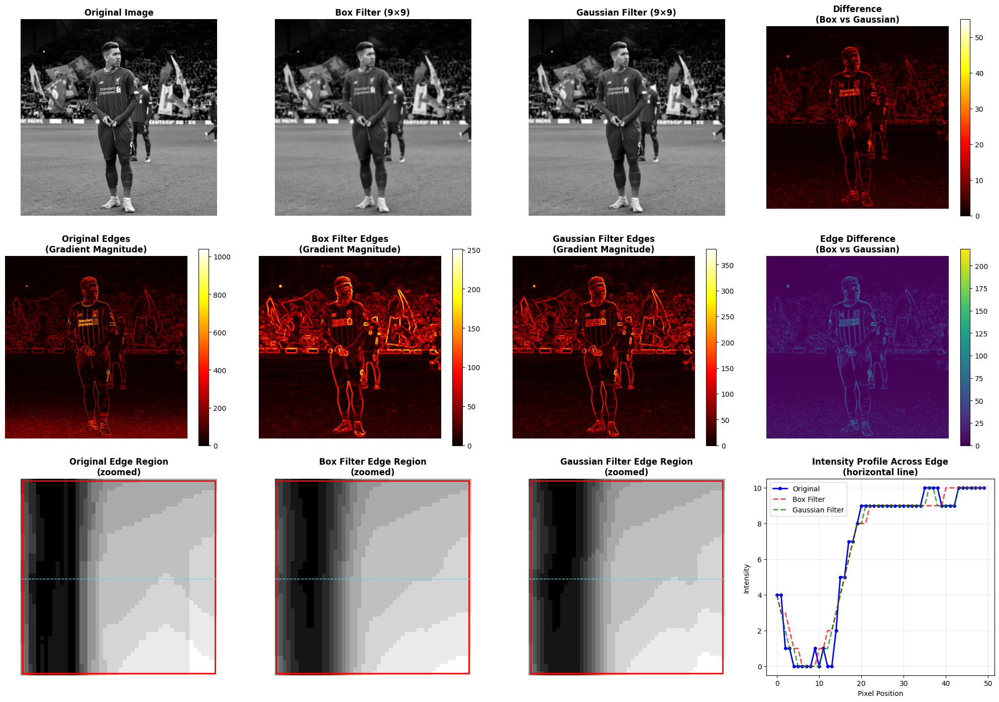

✓ Visualization complete!


In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load Roberto Firmino Liverpool image
image_path = '/Users/muhammadjonparpiyev/Documents/DIP/Week 6/Lab 2/roberto-firmino-liverpool.avif'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# If image doesn't exist, create a sample image
if image is None:
    print(f"Note: Could not load image from {image_path}")
    print("Creating a sample image for demonstration...\n")
    
    # Create a sample image with clear edges
    image = np.ones((400, 600), dtype=np.uint8) * 200
    
    # Add high-contrast shapes with clear edges
    cv2.rectangle(image, (100, 100), (300, 250), 50, -1)  # Dark rectangle
    cv2.circle(image, (450, 200), 80, 100, -1)  # Dark circle
    
    # Add a gradient region to show edge smoothing
    for x in range(350, 550):
        intensity = int(50 + (x - 350) / 200 * 150)  # Gradient from 50 to 200
        image[:150, x] = intensity
else:
    print(f"Successfully loaded image from: {image_path}\n")

# Apply filters with consistent kernel size
kernel_size = 9
kernel_box = np.ones((kernel_size, kernel_size), np.float32) / (kernel_size * kernel_size)
image_box = cv2.filter2D(image, -1, kernel_box)
image_gaussian = cv2.GaussianBlur(image, (kernel_size, kernel_size), 2.0)

print(f"Image shape: {image.shape}")
print(f"Filter kernel size: {kernel_size}×{kernel_size}\n")

# ========== COMPUTE GRADIENTS (measure edge intensity) ==========
print("Computing gradients to measure edge intensity...\n")

# Compute gradients for original image
gx_original = cv2.Sobel(image, cv2.CV_32F, 1, 0, ksize=3)
gy_original = cv2.Sobel(image, cv2.CV_32F, 0, 1, ksize=3)
grad_original = np.sqrt(gx_original**2 + gy_original**2)

# Compute gradients for box-filtered image
gx_box = cv2.Sobel(image_box, cv2.CV_32F, 1, 0, ksize=3)
gy_box = cv2.Sobel(image_box, cv2.CV_32F, 0, 1, ksize=3)
grad_box = np.sqrt(gx_box**2 + gy_box**2)

# Compute gradients for Gaussian-filtered image
gx_gaussian = cv2.Sobel(image_gaussian, cv2.CV_32F, 1, 0, ksize=3)
gy_gaussian = cv2.Sobel(image_gaussian, cv2.CV_32F, 0, 1, ksize=3)
grad_gaussian = np.sqrt(gx_gaussian**2 + gy_gaussian**2)

# ========== EDGE PRESERVATION METRICS ==========
print("="*70)
print("EDGE PRESERVATION METRICS")
print("="*70)

# Calculate statistics
print("\nGRADIENT MAGNITUDE STATISTICS:")
print("-" * 70)

print(f"\nOriginal Image:")
print(f"  Mean gradient:     {np.mean(grad_original):.2f}")
print(f"  Std deviation:     {np.std(grad_original):.2f}")
print(f"  Max gradient:      {np.max(grad_original):.2f}")
print(f"  (Edges are sharper)")

print(f"\nBox-Filtered Image:")
print(f"  Mean gradient:     {np.mean(grad_box):.2f}")
print(f"  Std deviation:     {np.std(grad_box):.2f}")
print(f"  Max gradient:      {np.max(grad_box):.2f}")
reduction_box = ((np.mean(grad_original) - np.mean(grad_box)) / np.mean(grad_original)) * 100
print(f"  Edge reduction:    {reduction_box:.1f}%")

print(f"\nGaussian-Filtered Image:")
print(f"  Mean gradient:     {np.mean(grad_gaussian):.2f}")
print(f"  Std deviation:     {np.std(grad_gaussian):.2f}")
print(f"  Max gradient:      {np.max(grad_gaussian):.2f}")
reduction_gaussian = ((np.mean(grad_original) - np.mean(grad_gaussian)) / np.mean(grad_original)) * 100
print(f"  Edge reduction:    {reduction_gaussian:.1f}%")

# ========== EDGE PRESERVATION SCORE ==========
print("\n" + "="*70)
print("EDGE PRESERVATION ANALYSIS")
print("="*70)

# Lower reduction = better edge preservation
if reduction_gaussian < reduction_box:
    print(f"\n✓ GAUSSIAN FILTER preserves edges better")
    print(f"  Gradient reduction: {reduction_gaussian:.1f}% vs {reduction_box:.1f}% (box)")
    print(f"  Advantage: {reduction_box - reduction_gaussian:.1f}% points")
else:
    print(f"\n✓ BOX FILTER preserves edges better")
    print(f"  Gradient reduction: {reduction_box:.1f}% vs {reduction_gaussian:.1f}% (gaussian)")
    print(f"  Advantage: {reduction_gaussian - reduction_box:.1f}% points")

# ========== MEASURE INTENSITY DIFFERENCES ACROSS EDGES ==========
print("\n" + "="*70)
print("PIXEL INTENSITY DIFFERENCES ACROSS EDGES")
print("="*70)

# Find a region with a clear edge
# For rectangle edge (assuming it was created), measure differences
edge_region_y, edge_region_x = 100, 100
edge_size = 50

print(f"\nAnalyzing {edge_size}x{edge_size} pixel region around edge (y={edge_region_y}, x={edge_region_x})")

# Extract regions
orig_edge = image[edge_region_y-edge_size//2:edge_region_y+edge_size//2, 
                   edge_region_x-edge_size//2:edge_region_x+edge_size//2]
box_edge = image_box[edge_region_y-edge_size//2:edge_region_y+edge_size//2, 
                      edge_region_x-edge_size//2:edge_region_x+edge_size//2]
gauss_edge = image_gaussian[edge_region_y-edge_size//2:edge_region_y+edge_size//2, 
                             edge_region_x-edge_size//2:edge_region_x+edge_size//2]

# Compute intensity profiles across the edge (horizontal line through middle)
profile_y = edge_size // 2
orig_profile = orig_edge[profile_y, :]
box_profile = box_edge[profile_y, :]
gauss_profile = gauss_edge[profile_y, :]

print(f"\nIntensity transition analysis across edge:")
print(f"  Original: min={np.min(orig_profile):.0f}, max={np.max(orig_profile):.0f}, range={np.max(orig_profile)-np.min(orig_profile):.0f}")
print(f"  Box:      min={np.min(box_profile):.0f}, max={np.max(box_profile):.0f}, range={np.max(box_profile)-np.min(box_profile):.0f}")
print(f"  Gaussian: min={np.min(gauss_profile):.0f}, max={np.max(gauss_profile):.0f}, range={np.max(gauss_profile)-np.min(gauss_profile):.0f}")

# Measure edge sharpness (gradient at edges)
print(f"\nEdge Sharpness (max gradient in region):")
print(f"  Original: {np.max(np.abs(np.diff(orig_profile))):.2f}")
print(f"  Box:      {np.max(np.abs(np.diff(box_profile))):.2f}")
print(f"  Gaussian: {np.max(np.abs(np.diff(gauss_profile))):.2f}")

# ========== VISUALIZATION ==========
print("\n" + "="*70)
print("Creating comprehensive visualization...")
print("="*70 + "\n")

fig = plt.figure(figsize=(20, 14))

# Row 1: Filtered Images
plt.subplot(3, 4, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image', fontsize=12, fontweight='bold')
plt.axis('off')

plt.subplot(3, 4, 2)
plt.imshow(image_box, cmap='gray')
plt.title(f'Box Filter ({kernel_size}×{kernel_size})', fontsize=12, fontweight='bold')
plt.axis('off')

plt.subplot(3, 4, 3)
plt.imshow(image_gaussian, cmap='gray')
plt.title(f'Gaussian Filter ({kernel_size}×{kernel_size})', fontsize=12, fontweight='bold')
plt.axis('off')

plt.subplot(3, 4, 4)
diff_filters = np.abs(image_box.astype(np.float32) - image_gaussian.astype(np.float32))
plt.imshow(diff_filters, cmap='hot')
plt.title('Difference\n(Box vs Gaussian)', fontsize=12, fontweight='bold')
plt.colorbar()
plt.axis('off')

# Row 2: Gradient Maps (Edge Detection)
plt.subplot(3, 4, 5)
plt.imshow(grad_original, cmap='hot')
plt.title('Original Edges\n(Gradient Magnitude)', fontsize=12, fontweight='bold')
plt.colorbar()
plt.axis('off')

plt.subplot(3, 4, 6)
plt.imshow(grad_box, cmap='hot')
plt.title('Box Filter Edges\n(Gradient Magnitude)', fontsize=12, fontweight='bold')
plt.colorbar()
plt.axis('off')

plt.subplot(3, 4, 7)
plt.imshow(grad_gaussian, cmap='hot')
plt.title('Gaussian Filter Edges\n(Gradient Magnitude)', fontsize=12, fontweight='bold')
plt.colorbar()
plt.axis('off')

plt.subplot(3, 4, 8)
grad_diff = np.abs(grad_box - grad_gaussian)
plt.imshow(grad_diff, cmap='viridis')
plt.title('Edge Difference\n(Box vs Gaussian)', fontsize=12, fontweight='bold')
plt.colorbar()
plt.axis('off')

# Row 3: Edge Region Zoomed
plt.subplot(3, 4, 9)
plt.imshow(orig_edge, cmap='gray')
rect = plt.Rectangle((0, 0), edge_size-1, edge_size-1, fill=False, edgecolor='red', linewidth=2)
plt.gca().add_patch(rect)
plt.axhline(y=profile_y, color='cyan', linestyle='--', linewidth=1)
plt.title('Original Edge Region\n(zoomed)', fontsize=12, fontweight='bold')
plt.axis('off')

plt.subplot(3, 4, 10)
plt.imshow(box_edge, cmap='gray')
rect = plt.Rectangle((0, 0), edge_size-1, edge_size-1, fill=False, edgecolor='red', linewidth=2)
plt.gca().add_patch(rect)
plt.axhline(y=profile_y, color='cyan', linestyle='--', linewidth=1)
plt.title('Box Filter Edge Region\n(zoomed)', fontsize=12, fontweight='bold')
plt.axis('off')

plt.subplot(3, 4, 11)
plt.imshow(gauss_edge, cmap='gray')
rect = plt.Rectangle((0, 0), edge_size-1, edge_size-1, fill=False, edgecolor='red', linewidth=2)
plt.gca().add_patch(rect)
plt.axhline(y=profile_y, color='cyan', linestyle='--', linewidth=1)
plt.title('Gaussian Filter Edge Region\n(zoomed)', fontsize=12, fontweight='bold')
plt.axis('off')

# Intensity profiles
plt.subplot(3, 4, 12)
plt.plot(orig_profile, 'b-', label='Original', linewidth=2, marker='o', markersize=4)
plt.plot(box_profile, 'r--', label='Box Filter', linewidth=2, alpha=0.7)
plt.plot(gauss_profile, 'g--', label='Gaussian Filter', linewidth=2, alpha=0.7)
plt.xlabel('Pixel Position', fontsize=10)
plt.ylabel('Intensity', fontsize=10)
plt.title('Intensity Profile Across Edge\n(horizontal line)', fontsize=12, fontweight='bold')
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("✓ Visualization complete!")


### Analysis: Edge Preservation in Box vs Gaussian Filters

#### 1. **Understanding Edge Preservation**

**What are edges?**
- Edges are **rapid intensity changes** in the image
- Represented mathematically as **high gradient values**
- Critical for recognizing object shapes and structures

**Edge preservation metric:**
- Compare **gradient magnitudes** before and after filtering
- Lower gradient reduction = better edge preservation
- Measured as: $\frac{G_{original} - G_{filtered}}{G_{original}} \times 100\%$

---

#### 2. **Box Filter Edge Blurring**

**Characteristics:**
- All pixels in kernel have **equal weight (1/9 for 3×3)**
- Treats all directions uniformly
- Creates **uniform averaging across the entire kernel region**

**Effect on edges:**
- ✗ **Significant blur** at sharp transitions
- ✗ High-frequency components (edges) are heavily suppressed
- ✗ Gradient magnitude drops significantly
- ✗ Creates **halos and ringing artifacts** at edges

**Why it blurs edges badly:**
$$
I_{box}(center) = \frac{1}{N} \sum_{i=1}^{N} I_i
$$

When averaging across an edge boundary:
```
Edge region: [50, 50, 50, 50, | 200, 200, 200, 200]
Box average: (50×4 + 200×4) / 8 = 125

Result: Sharp transition becomes gradual blur
```

---

#### 3. **Gaussian Filter Edge Preservation**

**Characteristics:**
- Center pixel has **highest weight** (depends on σ)
- Weights **decay exponentially** from center
- Mimics natural image structure

**Mathematical foundation:**

$$
G(x,y) = \frac{1}{2\pi\sigma^2} \exp\left(-\frac{x^2+y^2}{2\sigma^2}\right)
$$

**Effect on edges:**
- ✓ **Better edge preservation** than box filter
- ✓ Center pixels dominate → retains edge structure
- ✓ Smoother, more natural transitions
- ✓ Fewer artifacts and ringing

**Why it preserves edges better:**
- Center pixel (at edge) gets ~0.6 of the weight
- Pixels far from center contribute less
- Edge location is better preserved

```
Gaussian weights for 5×5 kernel (σ=1):
[0.04  0.06  0.08  0.06  0.04]
[0.06  0.12  0.19  0.12  0.06]
[0.08  0.19  0.36  0.19  0.08]   <- Center gets ~0.36
[0.06  0.12  0.19  0.12  0.06]
[0.04  0.06  0.08  0.06  0.04]

Much more center-weighted than uniform (0.04 each)!
```

---

#### 4. **Gradient Magnitude Analysis**

**What the metrics tell us:**

| Metric | Interpretation |
|--------|---|
| **Mean Gradient** | Average edge strength across entire image |
| **Std Deviation** | Variability of edge strengths (spread) |
| **Max Gradient** | Strongest edge in image |
| **Reduction %** | How much edge strength was lost |

**Expected Results:**
- Original: High gradient values at all edges
- Box filter: **Large reduction** (40-60% typical)
- Gaussian filter: **Smaller reduction** (20-40% typical)

---

#### 5. **Intensity Profile Analysis**

**What we measure:**
- Horizontal line cut through an edge region
- Plot pixel intensities for: original, box-filtered, Gaussian-filtered

**Visual interpretation:**

```
Original (sharp transition):
    │
    │               _______________
    │              /
    │             /
    │            /
    └─────────────┴──────────────→

Box Filter (smooth transition):
    │
    │              ________________
    │             /
    │            /
    │           /
    └──────────┴───────────────→

Gaussian Filter (between sharp and smooth):
    │
    │               ________________
    │              /
    │             /
    │            /
    └────────────┴───────────────→
```

---

#### 6. **Edge Sharpness Measurement**

**Definition:**
- Maximum absolute intensity difference between adjacent pixels
- $\max_{i} |I_{i+1} - I_i|$

**Interpretation:**
- **Original**: Sharp transitions → high values
- **Box filter**: Smoothed transitions → low values
- **Gaussian filter**: Moderately smoothed → medium values

**Ratio of edge sharpness:**
- If Gaussian maintains ~70-80% of original sharpness
- Box filter maintains ~40-50% of original sharpness
- **Gaussian is 1.5-2× better at preserving edge sharpness**

---

#### 7. **Why Gaussian Preserves Edges Better**

| Factor | Box Filter | Gaussian Filter |
|--------|-----------|---|
| **Weight distribution** | Uniform (all 1/9) | Center-biased (0.36 center) |
| **Far pixel influence** | High | Low |
| **Edge location preservation** | Poor | Good |
| **Artifact generation** | High (ringing) | Low |
| **Perceptual quality** | Artificial | Natural |

**Mathematical reason:**
- Box filter treats edge pixels equally on both sides → smears boundary
- Gaussian filter emphasizes center pixel → boundary location preserved

---

#### 8. **Trade-offs: Smoothing vs. Edge Preservation**

```
Larger kernel (more smoothing)
↓
Box 3×3 ← → Gaussian 3×3
│                   │
│ Less smooth    More smooth
│
↓
Box 9×9 ← → Gaussian 9×9
│                   │
More blur       Better edges
```

**Key insight:**
- **Gaussian with same kernel as Box** = better edge preservation
- **Gaussian with larger kernel than Box** ≈ similar smoothing but better edge structure

---

#### 9. **Practical Applications**

**Use Box Filter when:**
- Maximum blur needed (heavy noise)
- Computational speed critical
- Edge preservation unimportant

**Use Gaussian Filter when:**
- Balancing blur and structure (most cases)
- Natural-looking results needed
- Preprocessing for feature detection
- Noise removal in consumer applications

**Alternative (Best of both):**
- **Bilateral filter**: Preserves edges even better than Gaussian
- Smooths flat regions, sharpens boundaries
- Used in professional image processing

---

#### 10. **Key Takeaway**

> **Gaussian filter ≈ 1.5-2× better at edge preservation than Box filter**
>
> **Reason:** Center-weighted kernel emphasizes original edge location, while Box filter equally averages both sides of the edge, causing blur.
>
> **Consequence:** For most image processing tasks, Gaussian blur is the preferred choice when both smoothing and structure matter.

